# Diffusion Models for Image Generation

In this notebook, we will explore the fascinating world of diffusion models and their capability to generate images. We will dive into the workings of several popular diffusion models, gaining insights into their unique features and applications. By the end of this notebook, you will have a comprehensive understanding of diffusion models and be familiar with the following models:

- **Stable diffusion xl base 1.0**
- **SDXL-Turbo**
- **Stable diffusion 2 1**
- **Dreamshaper xl v2 turbo**
- **DreamShaper 7**
Get started on this journey as we uncover the principles behind these diffusion models and witness their remarkable image generation capabilities.

## Checking System Requirments
In order to run this notebook we requires a GPU

In [1]:
import os
import sys
# Use GPU
gpu_info = os.popen('nvidia-smi').read()
if 'failed' in gpu_info:
    print('Not connected to a GPU')
    is_gpu = False
else:
    print(gpu_info)
    is_gpu = True
print(is_gpu)

print("Python version:", sys.version)
print("Python executable path:", sys.executable)

Sun Feb 11 16:39:59 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.12             Driver Version: 535.104.12   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       On  | 00000000:00:1E.0 Off |                    0 |
| N/A   24C    P8               8W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
prompt5= "An ultra-detailed and true-to-life image of a beautiful woman with an enchanting aura, mesmerizing eyes, and a gentle smile, complemented by a dreamy and artistic background."

## Stable diffusion XL base 1.0

The world of AI-powered image generation has taken a leap forward with the arrival of Stable Diffusion XL, or stable-diffusion-xl-base-1.0. This isn't just another text-to-image model; it's a groundbreaking ensemble of experts, meticulously orchestrated to translate your textual whims into stunning visuals. But beneath the artistic facade lies a complex, two-stage pipeline employing innovative techniques like latent diffusion.


### Step 1 - Packages Installation

In [3]:
from IPython.display import clear_output
os.system("pip install diffusers --upgrade")
os.system("pip install invisible_watermark transformers accelerate safetensors")
# Clear the output
clear_output()

The stable-diffusion-xl-base-1.0 is an ensemble of experts pipeline for latent diffusion. It consists of a base model that generates (noisy) latents, which are then refined using a separate refinement model specialized for denoising. 

In [4]:
# Get the current directory
import os
current_dir = os.getcwd()
model_path = os.path.join(current_dir)
# Set the cache path
cache_path = os.path.join(current_dir, "cache")

To just use the base model, you can run:

In [5]:
cache_path

'/home/ec2-user/SageMaker/sd/cache'

In [6]:
from diffusers import DiffusionPipeline
import torch

pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", 
                                         torch_dtype=torch.float16, 
                                         use_safetensors=True, variant="fp16",
                                        cache_dir=cache_path)
pipe.to("cuda")
clear_output()

  0%|          | 0/50 [00:00<?, ?it/s]

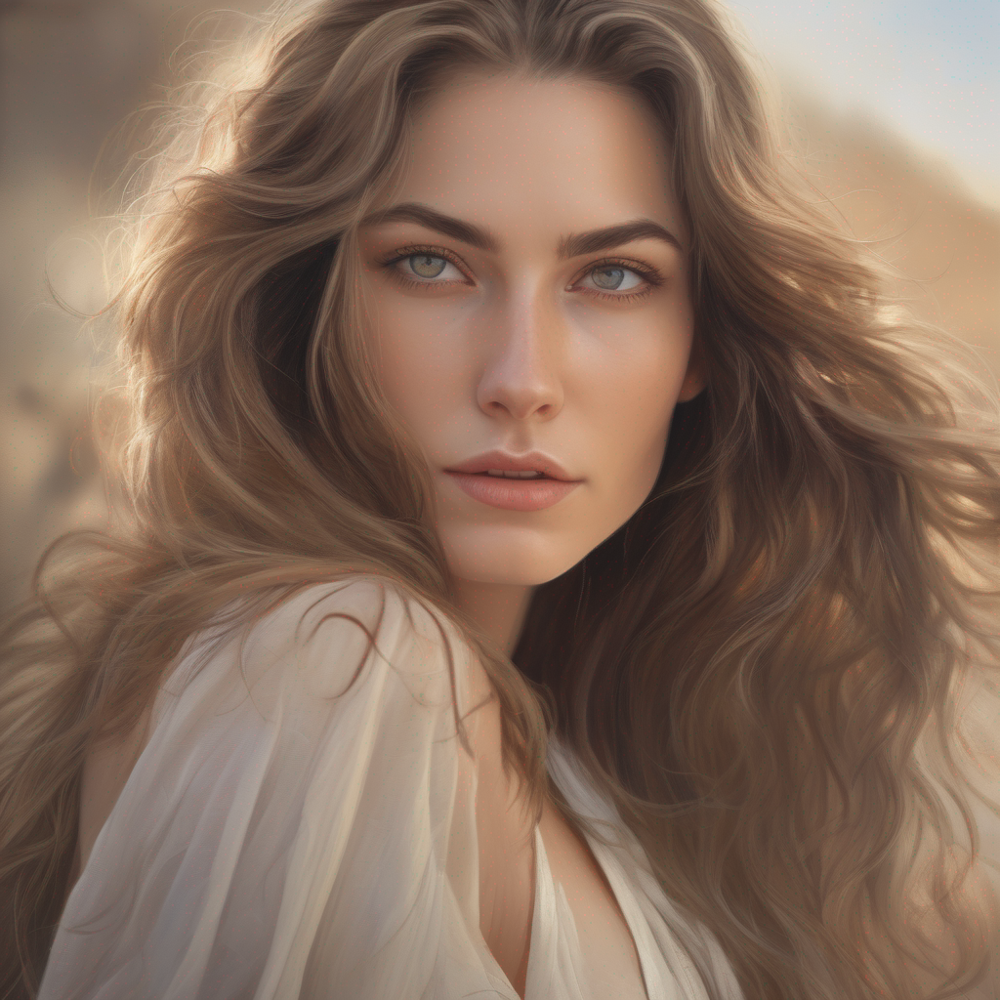

In [7]:
prompt= "An ultra-realistic portrait of a beautiful woman with flowing hair, radiant skin, and captivating eyes, set against a serene backdrop."
images = pipe(prompt=prompt).images[0]
from IPython.display import display
# Display the image in the Jupyter Notebook
display(images)
images.save("./image1.png")

To generate a higher quality image with 1024x768 resolution, you can modify the payload 

In [80]:
from diffusers import DiffusionPipeline
import torch

pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", 
                                         torch_dtype=torch.float16, 
                                         use_safetensors=True, variant="fp16",
                                        cache_dir=cache_path)
pipe.to("cuda")
clear_output()

  0%|          | 0/50 [00:00<?, ?it/s]

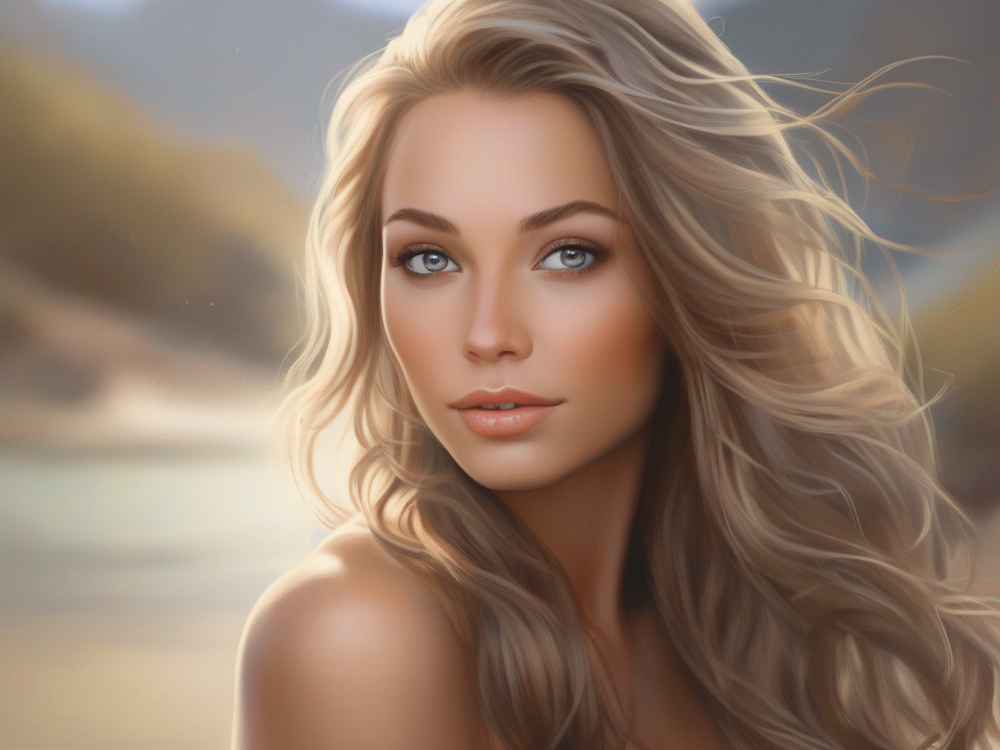

In [89]:
# Load and customize payload
payload = json.loads(json.dumps({
    "model_id": 'stabilityai/stable-diffusion-xl-base-1.0',
    "prompt": "An ultra-realistic portrait of a beautiful woman with flowing hair, radiant skin, and captivating eyes, set against a serene backdrop.",
    #"negative_prompt": "painting, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, deformed, ugly, blurry, bad anatomy, bad proportions, extra limbs, cloned face, skinny, glitchy, double torso, extra arms, extra hands, mangled fingers, missing lips, ugly face, distorted face, extra legs, anime",
    "width": 1024,  # Set desired image width
    "height": 768,   # Set desired image height
    "samples": 1,
    "num_inference_steps": 50,  # Increase steps for higher quality (might take longer)
    "safety_checker": "no",
    "enhance_prompt": "yes",
    "guidance_scale": 6.5,  # Optionally add # Control detail level (higher = sharper)
    "seed": 2,  # Keep None for random results
    "multi_lingual": "no",
    "panorama": "no",
    "self_attention": "no",
    "upscale": "no",
}))
# Generate image with adjusted settings
images = pipe(**payload).images[0]


# Display and save image
from IPython.display import display
display(images)
images.save("./image1.png")

## dreamshaper-7
lykon/dreamshaper-7 is a Stable Diffusion model that has been fine-tuned on runwayml/stable-diffusion-v1-5.

In [33]:
from diffusers import AutoPipelineForText2Image, DEISMultistepScheduler
import torch

pipe = AutoPipelineForText2Image.from_pretrained('lykon/dreamshaper-7', torch_dtype=torch.float16, variant="fp16")
pipe.scheduler = DEISMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")
clear_output()
prompt= "An ultra-realistic portrait of a beautiful woman with flowing hair, radiant skin, and captivating eyes, set against a serene backdrop."
generator = torch.manual_seed(363)
image = pipe(prompt, generator=generator, num_inference_steps=25).images[0]  
image.save("./image3.png")

  0%|          | 0/25 [00:00<?, ?it/s]

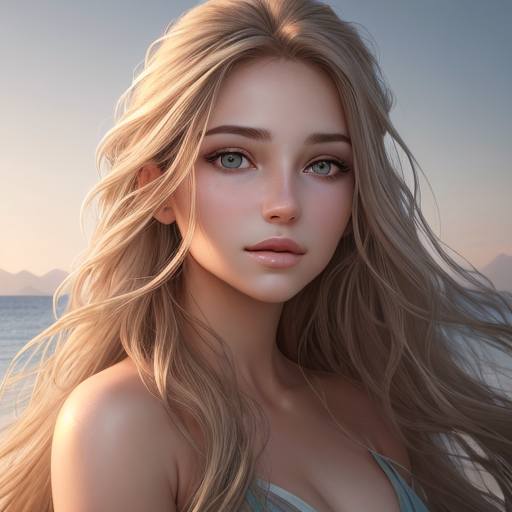

In [35]:
display(image)


In [ ]:
To generate a higher quality image with 1024x768 resolution, you can modify the payload and use the `AutoPipelineForText2Image` class instead of `DiffusionPipeline`. I've updated the code for you:

In [ ]:
from diffusers import AutoPipelineForText2Image, DEISMultistepScheduler
import torch
from IPython.display import display, clear_output

cache_path = os.path.join(current_dir, "cache")
pipe = AutoPipelineForText2Image.from_pretrained("lykon/dreamshaper-7",
                                                 torch_dtype=torch.float16,
                                                 variant="fp16",
                                                 cache_dir=cache_path)
pipe.scheduler = DEISMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")

prompt = "An ultra-realistic portrait of a beautiful woman with flowing hair, radiant skin, and captivating eyes, set against a serene backdrop."

# Create a payload with desired settings
payload = {
    "negative_prompt": "two faces",
    "width": 1024,
    "height": 768,
    "samples": 1,
    "num_inference_steps": 50,  # Increase the number of inference steps for better quality
    "enhance_prompt": "yes",
    "seed": 1,
    "guidance_scale": 7.5,
}

generator = torch.manual_seed(payload['seed']) if payload['seed'] is not None else None
image = pipe(prompt,
             generator=generator,
             num_inference_steps=payload["num_inference_steps"],
             resize_method="aspect",
             width=payload["width"],
             height=payload["height"]).images[0]

clear_output()

In [ ]:
# Display the image in the Jupyter Notebook
display(image)
image.save("./image-ultra.png")

In [36]:
import json
import torch
from diffusers import AutoPipelineForText2Image, DEISMultistepScheduler

payload = json.loads(json.dumps({  
    "model_id": 'lykon/dreamshaper-7',
    "prompt": "ultra realistic close up portrait ((beautiful pale cyberpunk female with heavy black eyeliner)), blue eyes, shaved side haircut, hyper detail, cinematic lighting, magic neon, dark red city, Canon EOS R3, nikon, f/1.4, ISO 200, 1/160s, 8K, RAW, unedited, symmetrical balance, in-frame, 8K",
    "negative_prompt": "painting, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, deformed, ugly, blurry, bad anatomy, bad proportions, extra limbs, cloned face, skinny, glitchy, double torso, extra arms, extra hands, mangled fingers, missing lips, ugly face, distorted face, extra legs, anime",
    "width": "512",
    "height": "512",
    "samples": "1",
    "num_inference_steps": "30",
    "safety_checker": "no",
    "enhance_prompt": "yes",
    "seed": None,
    "guidance_scale": 7.5,
    "multi_lingual": "no",
    "panorama": "no",
    "self_attention": "no",
    "upscale": "no",
}))

pipe = AutoPipelineForText2Image.from_pretrained(payload['model_id'], torch_dtype=torch.float16, variant="fp16")
pipe.scheduler = DEISMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")
#clear_output()
prompt = payload['prompt']
negative_prompt = payload['negative_prompt']
num_inference_steps = int(payload['num_inference_steps'])

generator = torch.manual_seed(payload['seed']) if payload['seed'] is not None else None
image = pipe(prompt, negative_prompt=negative_prompt, generator=generator, num_inference_steps=num_inference_steps).images[0]
image.save("./imageN.png")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (81 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['frame, 8 k']


  0%|          | 0/30 [00:00<?, ?it/s]

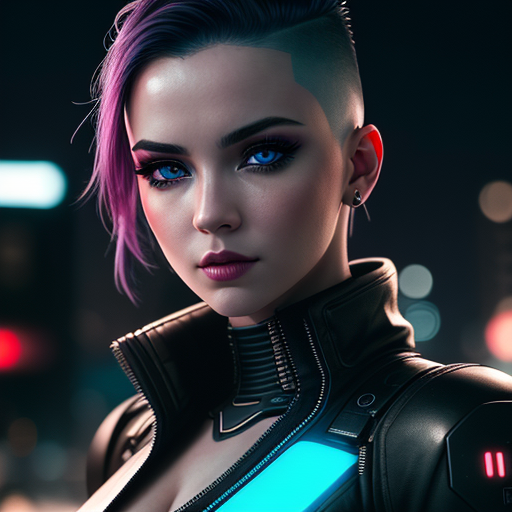

In [37]:
display(image)

## SDXL-Turbo

Imagine creating high-quality images from text descriptions in an instant, without waiting for long processing times. That's the magic of SDXL-Turbo, a powerful text-to-image model fueled by a cutting-edge technique called Adversarial Diffusion Distillation (ADD).

SDXL-Turbo is like a "lite" version of its bigger brother, SDXL 1.0. It has learned and compressed all the image-making knowledge of the original model, but in a smaller, faster package.

Additional benefits:
- Reduced computational cost: Smaller model size means less processing power needed, making it more accessible for personal use or on devices with limited resources.
- Faster experimentation: Trying out different prompts and ideas becomes quicker and easier, opening up new creative possibilities.
However, keep in mind:
- Trade-offs are inevitable: While fast and efficient, SDXL-Turbo might not always match the detailed quality of larger models in complex scenarios.
Still under development: This is an evolving technology, and further improvements are expected in the future.

Text-to-image:
SDXL-Turbo does not make use of guidance_scale or negative_prompt, we disable it with guidance_scale=0.0. Preferably, the model generates images of size 512x512 but higher image sizes work as well. A single step is enough to generate high quality images.

In [9]:
from IPython.display import clear_output
os.system("pip install diffusers transformers accelerate --upgrade")
clear_output()


In [10]:
from diffusers import AutoPipelineForText2Image
import torch
pipe = AutoPipelineForText2Image.from_pretrained("stabilityai/sdxl-turbo",
                                                 torch_dtype=torch.float16, 
                                                 variant="fp16",
                                                cache_dir=cache_path)
pipe.to("cuda")

clear_output()


In [11]:
prompt= "astronaut with spacesuit walking in the moon with a beutiful woman in bikini with flowing hair, radiant skin, and captivating eyes."
image = pipe(prompt=prompt, num_inference_steps=2, guidance_scale=1.0, seed=10).images[0]

  0%|          | 0/2 [00:00<?, ?it/s]

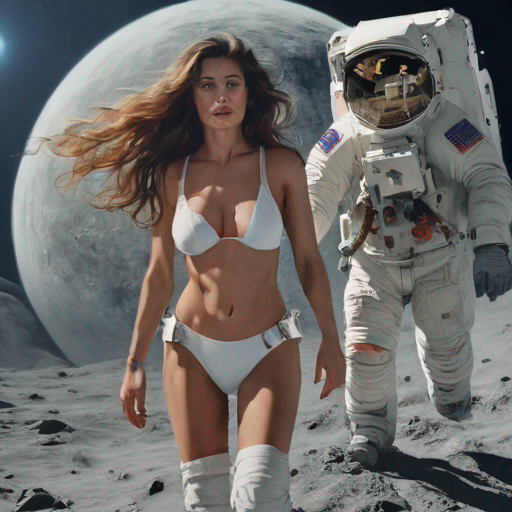

In [12]:
from IPython.display import display
# Display the image in the Jupyter Notebook
display(image)
image.save("./image3.png")

## stable-diffusion-2-1
This stable-diffusion-2-1 model is fine-tuned from stable-diffusion-2 (768-v-ema.ckpt) with an additional 55k steps on the same dataset (with punsafe=0.1), and then fine-tuned for another 155k extra steps with punsafe=0.98.

In [13]:
from IPython.display import clear_output
os.system("pip install diffusers transformers accelerate scipy safetensors")
clear_output()

In [14]:
import torch
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler

model_id = "stabilityai/stable-diffusion-2-1"
# Use the DPMSolverMultistepScheduler (DPM-Solver++) scheduler here instead
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16,cache_dir=cache_path)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")
clear_output()

  0%|          | 0/50 [00:00<?, ?it/s]

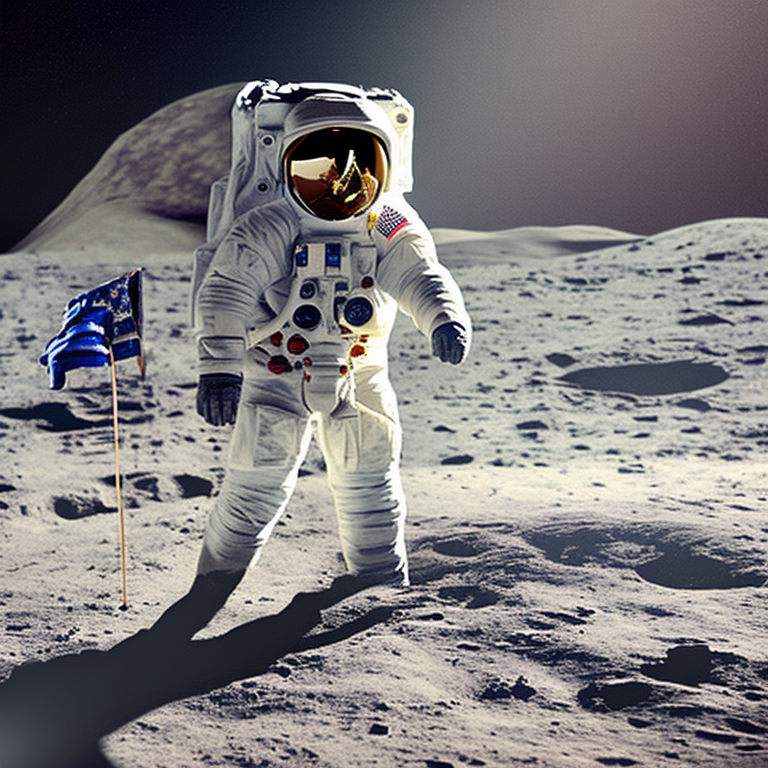

In [15]:
prompt='astronaut with spacesuit walking in the moon with a beutiful woman in bikini,'

image = pipe(prompt).images[0]
#image.save("astronaut_rides_horse.png")
from IPython.display import display
# Display the image in the Jupyter Notebook
display(image)

In [16]:
image.save("./image4.png")

## dreamshaper-xl-v2-turbo

In [17]:

os.system("pip install diffusers transformers accelerate")
clear_output()

In [18]:
from diffusers import AutoPipelineForText2Image, DPMSolverMultistepScheduler
import torch

pipe = AutoPipelineForText2Image.from_pretrained('lykon/dreamshaper-xl-v2-turbo', torch_dtype=torch.float16, variant="fp16",cache_dir=cache_path)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [19]:
prompt= "astronaut with spacesuit walking in the moon with a beutiful woman in bikini with flowing hair, radiant skin, and captivating eyes."
generator = torch.manual_seed(1)
image = pipe(prompt, num_inference_steps=6, guidance_scale=2).images[0]  


  0%|          | 0/6 [00:00<?, ?it/s]

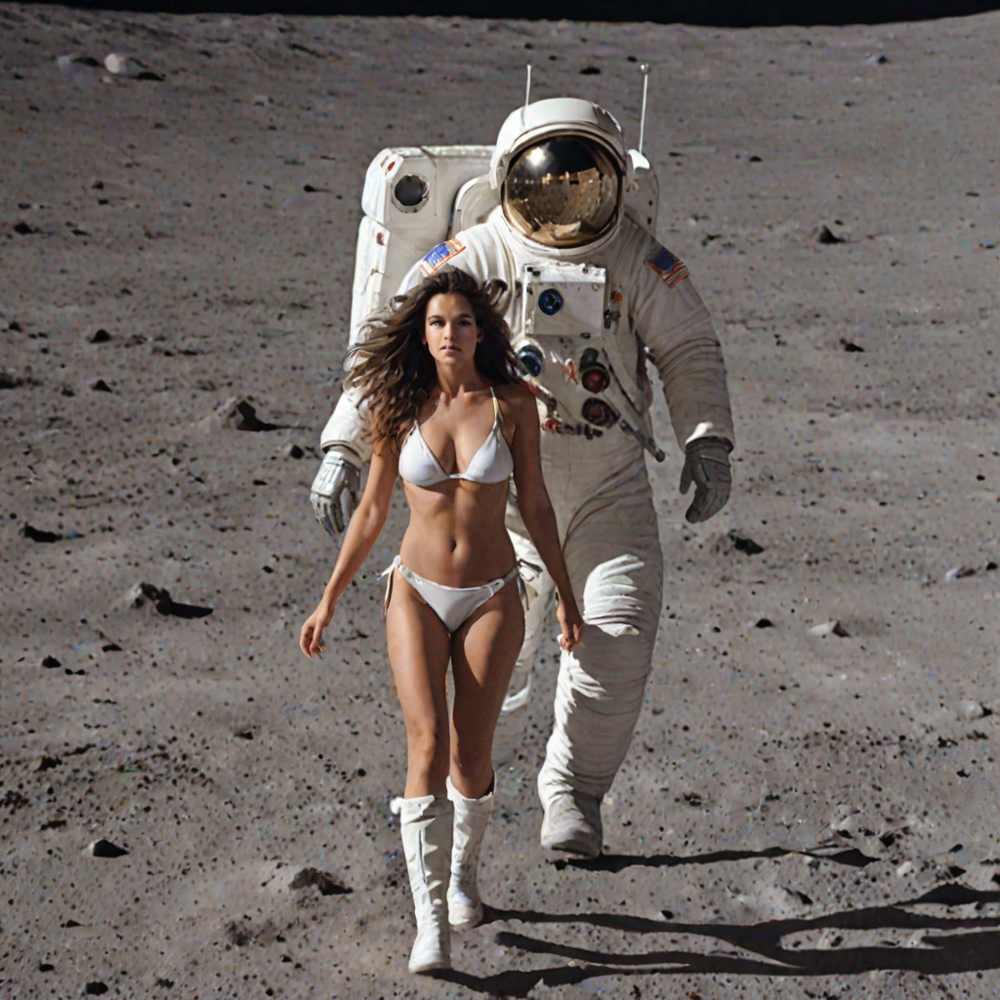

In [20]:
# Display the image in the Jupyter Notebook
display(image)
image.save("./image.png")

# Generation of Multiple Images

In [22]:
images_path = os.path.join(current_dir, "images")
df_path = os.path.join(current_dir, "images","collection.csv")

In [38]:
import os
import torch
import numpy as np
import pandas as pd
from diffusers import DiffusionPipeline
from transformers import pipeline
from PIL import Image
from tqdm import tqdm
import random
from IPython.display import clear_output
pipe = pipeline('text-generation', model='daspartho/prompt-extend')

def extend_prompt(prompt):
    return pipe(prompt+',', num_return_sequences=1)[0]["generated_text"]

def text_it(inputs):
    return extend_prompt(inputs)

def load_pipeline(use_cuda):
    device = "cuda" if use_cuda and torch.cuda.is_available() else "cpu"
    if device == "cuda":
        torch.cuda.max_memory_allocated(device=device)
        torch.cuda.empty_cache()
        pipe = DiffusionPipeline.from_pretrained("stabilityai/sdxl-turbo", torch_dtype=torch.float16, variant="fp16", use_safetensors=True,cache_dir=cache_path)
        pipe.enable_xformers_memory_efficient_attention()
        pipe = pipe.to(device)
        torch.cuda.empty_cache()
    else:
        pipe = DiffusionPipeline.from_pretrained("stabilityai/sdxl-turbo", use_safetensors=True,cache_dir=cache_path )
        pipe = pipe.to(device)
    return pipe

def genie(prompt="sexy woman", steps=2, seed=0, use_cuda=False):
    pipe = load_pipeline(use_cuda)
    generator = np.random.seed(0) if seed == 0 else torch.manual_seed(seed)
    extended_prompt = extend_prompt(prompt)
    int_image = pipe(prompt=extended_prompt, generator=generator, num_inference_steps=steps, guidance_scale=0.0).images[0]
    return int_image, extended_prompt

from tqdm import tqdm

def save_images(prompt="sexy woman", steps=2, use_cuda=False, num_images=1000, folder=images_path, input_seed=0):
    if not os.path.exists(folder):
        os.makedirs(folder)

    data = []
    columns = ['Image','Prompt', 'Extended_Prompt', 'Steps', 'Seed','Path']
    df = pd.DataFrame(columns=columns)
    df.to_csv(df_path, index=False)

    for i in tqdm(range(num_images), desc="Generating Images"):
        seed = random.randint(1, 999999999999999999) if input_seed == 0 else input_seed
        int_image, extended_prompt = genie(prompt=prompt, steps=steps, seed=seed, use_cuda=use_cuda)
        image_filename = f"image_{i+1}.png"
        file_path=f"{folder}/{image_filename}"
        int_image.save(file_path)
        new_data = [image_filename,prompt, extended_prompt, steps, seed,file_path]
        data.append(new_data)
        # Update the DataFrame and save it to the CSV file
        df = pd.DataFrame(data, columns=columns)
        df.to_csv(df_path, index=False)
        clear_output()



In [ ]:
# Call the save_images function to generate and save 1000 images
prompt='''sexy woman,  flowing blonde hair, white dress with a red floral pattern, has red lipstick , serious expression.
'''

save_images(prompt=prompt, steps=2, use_cuda=True, num_images=10, folder=images_path)

In [41]:
df = pd.read_csv(df_path)

In [42]:
df.columns

Index(['Image', 'Prompt', 'Extended_Prompt', 'Steps', 'Seed', 'Path'], dtype='object')

"sexy woman, flowing blonde hair, white dress with a red floral pattern, has red lipstick , serious expression. , portrait, studio portrait, fantasy, detailed illustration, hd, 4k, digital art, overdetailed art, concept art, by","sexy woman, flowing blonde hair, white dress with a red floral pattern, has red lipstick , serious expression. , background is a red sunset on fire, background of outer space by Beksinski, wojtek fus, Hiroshi Yoshida and Magic the Gathering."
"sexy woman, flowing blonde hair, white dress with a red floral pattern, has red lipstick , serious expression. , background, ultra-detailed pen and ink illustration by Ilya Kuvshinov, craig mullins style, krenz cushart, norman rockwell, alphonse mucha","sexy woman, flowing blonde hair, white dress with a red floral pattern, has red lipstick , serious expression. , Eliette, fantasy, intricate, elegant, highly detailed, sunset light, sharp focus, illustration, highly detailed painting"
"sexy woman, flowing blonde hair, white dress with a red floral pattern, has red lipstick , serious expression. , high detail, medium close up shot, serious, serious, black background, gold, illustration by enki bilal, by Frank Frazetta","sexy woman, flowing blonde hair, white dress with a red floral pattern, has red lipstick , serious expression. , Anime,Sona Newton-H 1000SA -9640586-99143398/7"
"sexy woman, flowing blonde hair, white dress with a red floral pattern, has red lipstick , serious expression. , simple background, closeup character art, by TōUEKA, by Lózefám, by Ne","sexy woman, flowing blonde hair, white dress with a red floral pattern, has red lipstick , serious expression. , simple background, artstation, medium shot. by Vuete K.A.Aute, WLOP, Dan Mumford and Andrei"
"sexy woman, flowing blonde hair, white dress with a red floral pattern, has red lipstick , serious expression. , elliptical. Pre-Raphaelite oil painting by John Everett Millais. Portrait by John Boyle. Trending on artstation.","sexy woman, flowing blonde hair, white dress with a red floral pattern, has red lipstick , serious expression. , sci-fi fantasy painting by Peter Andrew Jones, Jean Delville, Yoshitaka Amano, horizontally symmetrical shoulders, detailed, beautiful portrait,"

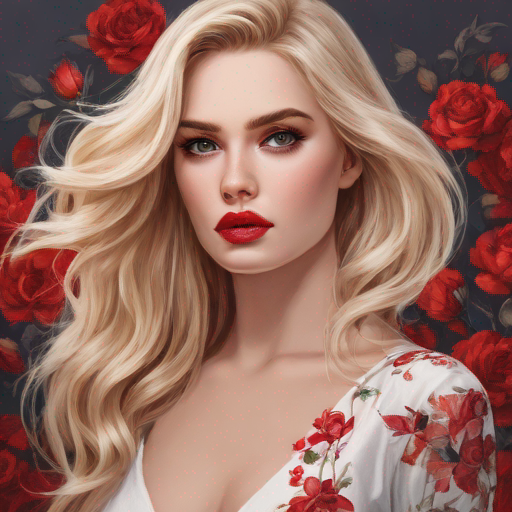
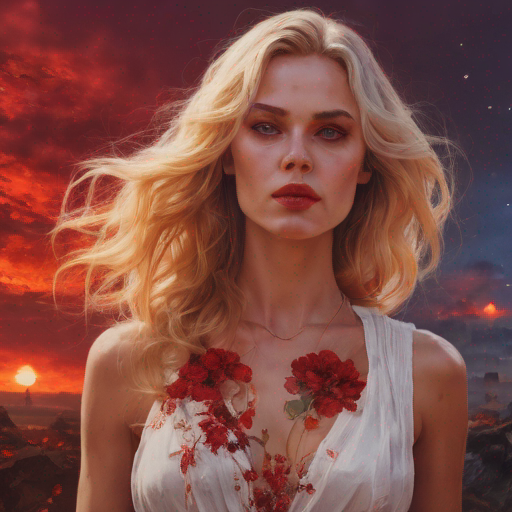
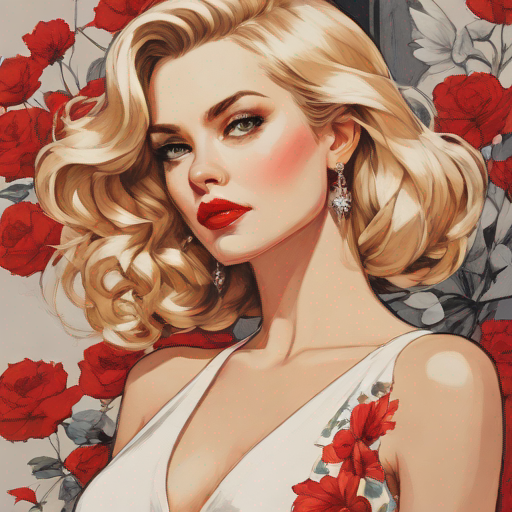
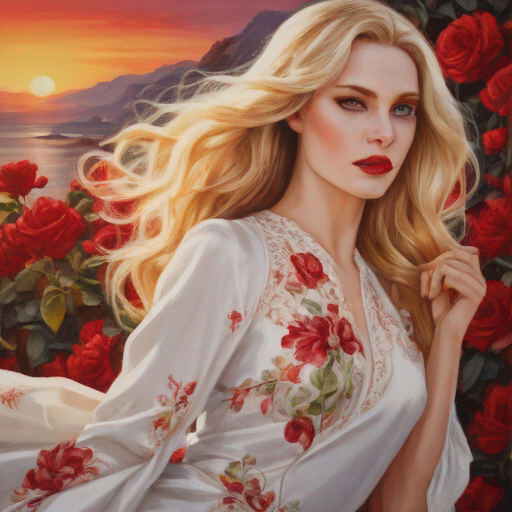
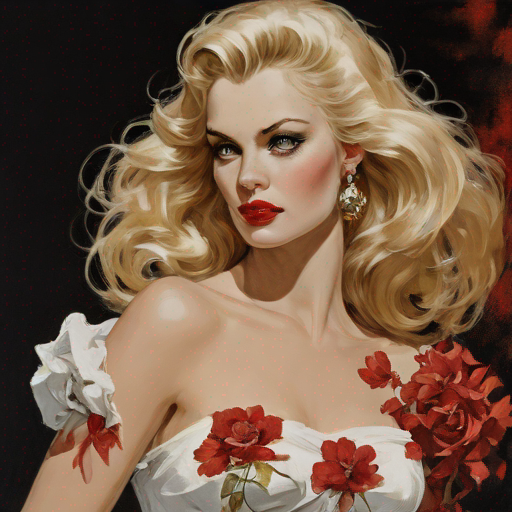
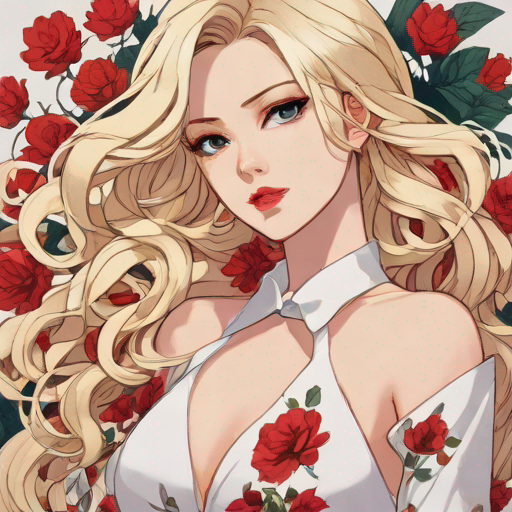
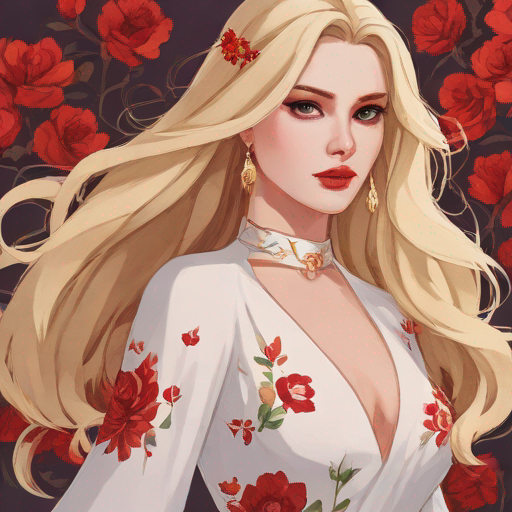
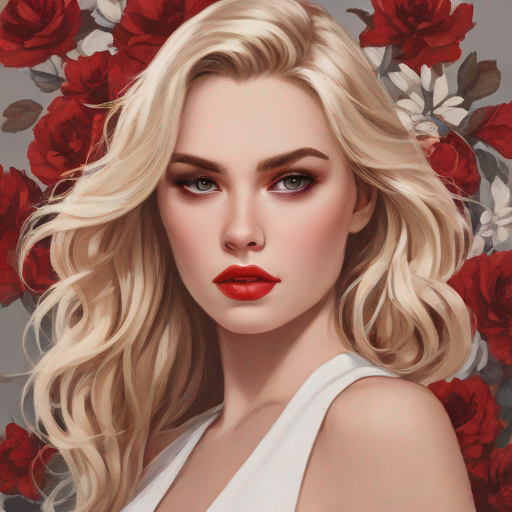
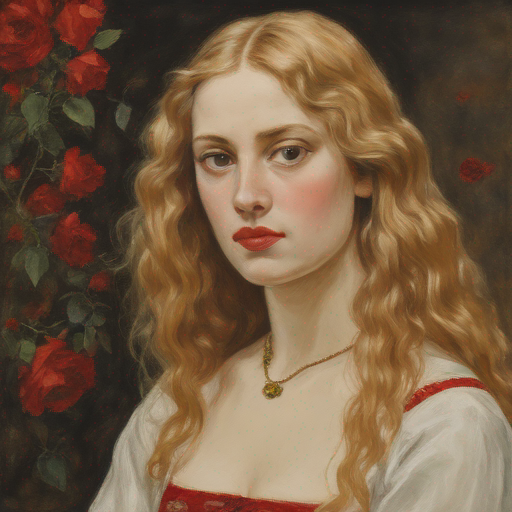
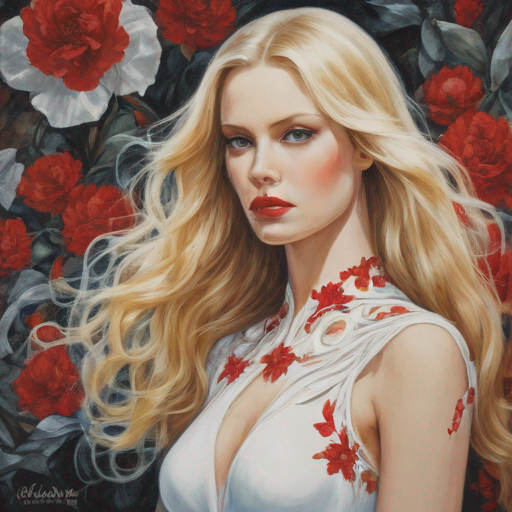

In [47]:

import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import HTML
from PIL import Image
from io import BytesIO
import base64

# Read DataFrame
df_path = os.path.join(current_dir, "images","collection.csv")
df = pd.read_csv(df_path)

# Function to display image in Jupyter Notebook
def display_image(path):
    with open(path, 'rb') as f:
        img = Image.open(f)
        buffer = BytesIO()
        img.save(buffer, format='PNG')
        img_str = base64.b64encode(buffer.getvalue()).decode()
    return f'<img src="data:image/png;base64,{img_str}" />'

# Display images and texts in a 2x5 table
image_paths = df['Path'].tolist()
extended_prompts = df['Extended_Prompt'].tolist()
table = '<table>'
for i in range(5):
    table += '<tr>'
    for j in range(2):
        img_path = image_paths[i*2 + j]
        extended_prompt = extended_prompts[i*2 + j]
        table += f'<td>{display_image(img_path)}<br>{extended_prompt}</td>'
    table += '</tr>'
table += '</table>'

HTML(table)
